<a href="https://colab.research.google.com/github/9-coding/ComputerVision_TeamProject/blob/main/ActiveLearning2/ActiveLearning2_modelCompare_resnext101.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

import os
# 각자 환경에서 이 부분만 변경하여 사용하면 됩니다.
os.chdir('/content/gdrive/MyDrive/CUB_200_2011_repackage_class50')
print(os.getcwd())



Mounted at /content/gdrive/
/content/gdrive/MyDrive/CUB_200_2011_repackage_class50


In [2]:
# !pip uninstall wandb

In [3]:
!pip install wandb

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 33.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 25.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.9/243.9 kB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.7 MB/s eta 0:00:00


In [4]:
!wandb login f9fc6c65de4904021a59f4c8c60b90961f6ec1fb

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import time
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from PIL import Image
import random

## wandb ###
import wandb
wandb.init(project='ActiveLearning2_modelCompare')


### GPU Setting ###
USE_CUDA = torch.cuda.is_available()
DEVICE = torch.device("cuda" if USE_CUDA else "cpu")
print(DEVICE)

### Custom Dataset ###
class CUB2011(Dataset):
    def __init__(self, transform, mode='train'):
        self.transform = transform
        self.mode = mode
        self.image_folder = os.listdir(f'./datasets/{mode}')

    def __len__(self):
        return len(self.image_folder)

    def __getitem__(self, idx):
        img_path = self.image_folder[idx]
        img = Image.open(os.path.join('./datasets', self.mode, img_path)).convert('RGB')
        img = self.transform(img)
        label = int(img_path.split('_')[-1].split('.')[0])
        return (img, label)

wandb: Currently logged in as: kdy1021 (computervisionactivelearning). Use `wandb login --relogin` to force relogin


cuda


In [6]:
### Data Augmentation ###
def transforms_func(transform):
  return transforms.Compose([
    transforms.Resize((448, 448)),
    transform,
    transforms.ToTensor(),
])

def transforms_resize_func(resize):
  return transforms.Compose([
    resize,
    transforms.ToTensor(),
])

ROTATION_DEGREE = 30
zoom_scale = (0.8, 1.2)
transforms_rotation = transforms_func(transforms.RandomRotation(degrees=ROTATION_DEGREE))
transforms_horizontal_flip = transforms_func(transforms.RandomHorizontalFlip(p=1.0))
transforms_zoom = transforms_func(transforms.RandomResizedCrop(448, scale=zoom_scale))

transforms_train = transforms_resize_func(transforms.Resize((448, 448)))
transforms_valtest = transforms_resize_func(transforms.Resize((448, 448)))
transforms_random_resized_crop = transforms_resize_func(transforms.RandomResizedCrop(448, scale=(0.8, 1.0)))

In [7]:
BATCH_SIZE = 8
EPOCH = 10
lr = 0.1

train_set = CUB2011(mode='train', transform=transforms_train)
train_set_rotation = CUB2011(mode='train', transform=transforms_rotation)
train_set_horizontal_flip = CUB2011(mode='train', transform=transforms_horizontal_flip)
train_set_randomcrop =  CUB2011(mode='train', transform=transforms_random_resized_crop)
train_set_zoom = CUB2011(mode='train', transform=transforms_zoom)

combined_train_set = ConcatDataset([train_set, train_set_horizontal_flip, train_set_zoom])

val_set = CUB2011(mode='valid', transform=transforms_valtest)
test_set = CUB2011(mode='test', transform=transforms_valtest)

train_loader = DataLoader(combined_train_set, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)

In [8]:
import torchsummary

### Model / Optimizer ###
model = models.resnext101_64x4d(pretrained=True)

num_features = model.fc.in_features

# Adjusting for augmentation
model.fc = nn.Linear(num_features, 50)
model = model.to(DEVICE)
optimizer = optim.SGD(model.parameters(), lr=lr)

print("resnext101")
print(torchsummary.summary(model, (3, 448, 448)))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt101_64X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt101_64X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext101_64x4d-173b62eb.pth" to /root/.cache/torch/hub/checkpoints/resnext101_64x4d-173b62eb.pth
100%|██████████| 319M/319M [00:03<00:00, 98.6MB/s]


resnext101
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           9,408
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
         MaxPool2d-4         [-1, 64, 112, 112]               0
            Conv2d-5        [-1, 256, 112, 112]          16,384
       BatchNorm2d-6        [-1, 256, 112, 112]             512
              ReLU-7        [-1, 256, 112, 112]               0
            Conv2d-8        [-1, 256, 112, 112]           9,216
       BatchNorm2d-9        [-1, 256, 112, 112]             512
             ReLU-10        [-1, 256, 112, 112]               0
           Conv2d-11        [-1, 256, 112, 112]          65,536
      BatchNorm2d-12        [-1, 256, 112, 112]             512
           Conv2d-13        [-1, 256, 112, 112]          16,384
      BatchNorm2d-14        

In [9]:
### Train/Evaluation ###
def train(model, train_loader, optimizer, epoch):
    model.train()
    for i, (image, target) in enumerate(train_loader):
        image, target = image.to(DEVICE), target.to(DEVICE)
        output = model(image)
        optimizer.zero_grad()
        train_loss = F.cross_entropy(output, target).to(DEVICE)
        train_loss.backward()
        optimizer.step()

        if i % 30 == 0:
            print(f'Train Epoch {epoch} [{i}/{len(train_loader)}]\tLoss: {train_loss.item():.6f}')
    return train_loss

def evaluate(model, val_loader):
    model.eval()
    eval_loss = 0
    correct = 0
    with torch.no_grad():
        for i, (image, target) in enumerate(val_loader):
            image, target = image.to(DEVICE), target.to(DEVICE)
            output = model(image)
            eval_loss += F.cross_entropy(output, target, reduction='sum').item()
            pred = output.max(1, keepdim=True)[1]
            correct += pred.eq(target.view_as(pred)).sum().item()
        eval_loss /= len(val_loader.dataset)
        eval_accuracy = 100 * correct / len(val_loader.dataset)
        return eval_loss, eval_accuracy

Train Epoch 0 [0/885]	Loss: 3.932261
Train Epoch 0 [30/885]	Loss: 3.929875
Train Epoch 0 [60/885]	Loss: 3.436138
Train Epoch 0 [90/885]	Loss: 3.108401
Train Epoch 0 [120/885]	Loss: 2.918109
Train Epoch 0 [150/885]	Loss: 1.684948
Train Epoch 0 [180/885]	Loss: 1.419341
Train Epoch 0 [210/885]	Loss: 1.070713
Train Epoch 0 [240/885]	Loss: 0.349075
Train Epoch 0 [270/885]	Loss: 0.681434
Train Epoch 0 [300/885]	Loss: 0.259981
Train Epoch 0 [330/885]	Loss: 0.354857
Train Epoch 0 [360/885]	Loss: 0.392247
Train Epoch 0 [390/885]	Loss: 0.880168
Train Epoch 0 [420/885]	Loss: 0.066544
Train Epoch 0 [450/885]	Loss: 0.773191
Train Epoch 0 [480/885]	Loss: 0.078972
Train Epoch 0 [510/885]	Loss: 0.464674
Train Epoch 0 [540/885]	Loss: 0.070667
Train Epoch 0 [570/885]	Loss: 0.627082
Train Epoch 0 [600/885]	Loss: 0.085774
Train Epoch 0 [630/885]	Loss: 0.036425
Train Epoch 0 [660/885]	Loss: 0.260047
Train Epoch 0 [690/885]	Loss: 0.009681
Train Epoch 0 [720/885]	Loss: 0.265157
Train Epoch 0 [750/885]	Loss: 

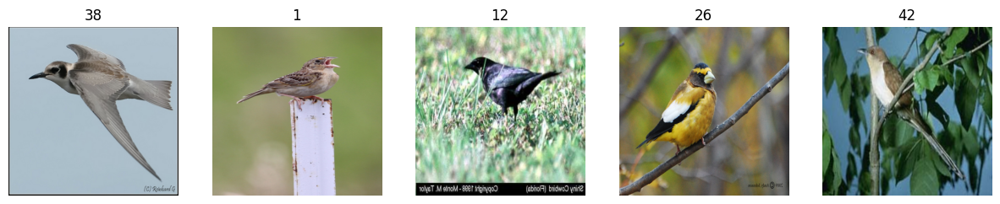

Epoch 0
Train Loss: 0.0248, Validation Loss: 0.3058, Validation Accuracy: 92.57%

Train Epoch 1 [0/885]	Loss: 0.030656
Train Epoch 1 [30/885]	Loss: 0.061342
Train Epoch 1 [60/885]	Loss: 0.103256
Train Epoch 1 [90/885]	Loss: 0.007530
Train Epoch 1 [120/885]	Loss: 0.003323
Train Epoch 1 [150/885]	Loss: 0.007225
Train Epoch 1 [180/885]	Loss: 0.008035
Train Epoch 1 [210/885]	Loss: 0.200117
Train Epoch 1 [240/885]	Loss: 0.119729
Train Epoch 1 [270/885]	Loss: 0.207407
Train Epoch 1 [300/885]	Loss: 0.010493
Train Epoch 1 [330/885]	Loss: 0.010459
Train Epoch 1 [360/885]	Loss: 0.009001
Train Epoch 1 [390/885]	Loss: 0.010961
Train Epoch 1 [420/885]	Loss: 0.087435
Train Epoch 1 [450/885]	Loss: 0.265499
Train Epoch 1 [480/885]	Loss: 0.103308
Train Epoch 1 [510/885]	Loss: 0.001919
Train Epoch 1 [540/885]	Loss: 0.023846
Train Epoch 1 [570/885]	Loss: 0.011136
Train Epoch 1 [600/885]	Loss: 0.006246
Train Epoch 1 [630/885]	Loss: 0.015766
Train Epoch 1 [660/885]	Loss: 0.004586
Train Epoch 1 [690/885]	Lo

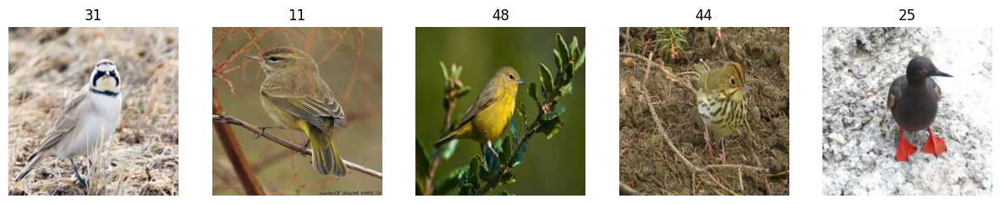

Epoch 1
Train Loss: 0.0090, Validation Loss: 0.2766, Validation Accuracy: 93.24%

Train Epoch 2 [0/885]	Loss: 0.005247
Train Epoch 2 [30/885]	Loss: 0.031726
Train Epoch 2 [60/885]	Loss: 0.003896
Train Epoch 2 [90/885]	Loss: 0.019482
Train Epoch 2 [120/885]	Loss: 1.513944
Train Epoch 2 [150/885]	Loss: 0.002553
Train Epoch 2 [180/885]	Loss: 0.010224
Train Epoch 2 [210/885]	Loss: 0.003934
Train Epoch 2 [240/885]	Loss: 0.026438
Train Epoch 2 [270/885]	Loss: 0.004652
Train Epoch 2 [300/885]	Loss: 0.001688
Train Epoch 2 [330/885]	Loss: 0.002842
Train Epoch 2 [360/885]	Loss: 0.001595
Train Epoch 2 [390/885]	Loss: 0.185838
Train Epoch 2 [420/885]	Loss: 0.002827
Train Epoch 2 [450/885]	Loss: 0.004028
Train Epoch 2 [480/885]	Loss: 0.002056
Train Epoch 2 [510/885]	Loss: 0.012006
Train Epoch 2 [540/885]	Loss: 0.056006
Train Epoch 2 [570/885]	Loss: 0.386982
Train Epoch 2 [600/885]	Loss: 0.126209
Train Epoch 2 [630/885]	Loss: 0.001357
Train Epoch 2 [660/885]	Loss: 0.003333
Train Epoch 2 [690/885]	Lo

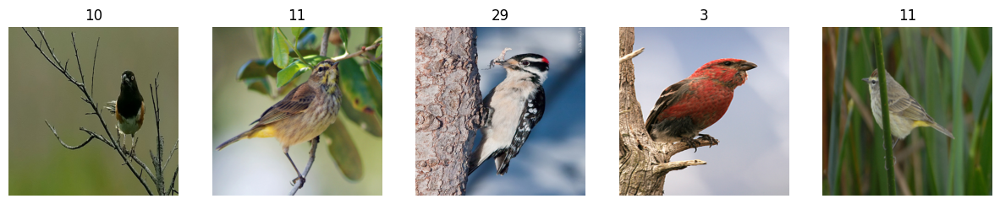

Epoch 2
Train Loss: 0.0783, Validation Loss: 0.1881, Validation Accuracy: 95.95%

Train Epoch 3 [0/885]	Loss: 0.001183
Train Epoch 3 [30/885]	Loss: 0.001036
Train Epoch 3 [60/885]	Loss: 0.002452
Train Epoch 3 [90/885]	Loss: 0.003852
Train Epoch 3 [120/885]	Loss: 0.009294
Train Epoch 3 [150/885]	Loss: 0.002198
Train Epoch 3 [180/885]	Loss: 0.001234
Train Epoch 3 [210/885]	Loss: 0.003862
Train Epoch 3 [240/885]	Loss: 0.003443
Train Epoch 3 [270/885]	Loss: 0.001117
Train Epoch 3 [300/885]	Loss: 0.000794
Train Epoch 3 [330/885]	Loss: 0.007499
Train Epoch 3 [360/885]	Loss: 0.005825
Train Epoch 3 [390/885]	Loss: 0.003763
Train Epoch 3 [420/885]	Loss: 0.024354
Train Epoch 3 [450/885]	Loss: 0.007293
Train Epoch 3 [480/885]	Loss: 0.002238
Train Epoch 3 [510/885]	Loss: 0.002803
Train Epoch 3 [540/885]	Loss: 0.001638
Train Epoch 3 [570/885]	Loss: 0.002307
Train Epoch 3 [600/885]	Loss: 0.000397
Train Epoch 3 [630/885]	Loss: 0.008065
Train Epoch 3 [660/885]	Loss: 0.001289
Train Epoch 3 [690/885]	Lo

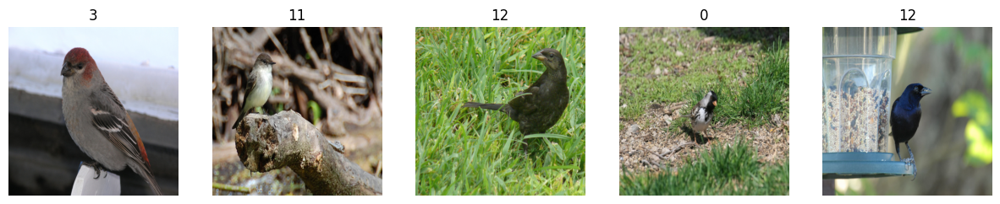

Epoch 3
Train Loss: 0.0004, Validation Loss: 0.2080, Validation Accuracy: 96.28%

Train Epoch 4 [0/885]	Loss: 0.001416
Train Epoch 4 [30/885]	Loss: 0.002217
Train Epoch 4 [60/885]	Loss: 0.001117
Train Epoch 4 [90/885]	Loss: 0.000657
Train Epoch 4 [120/885]	Loss: 0.001101
Train Epoch 4 [150/885]	Loss: 0.007582
Train Epoch 4 [180/885]	Loss: 0.000952
Train Epoch 4 [210/885]	Loss: 0.000291
Train Epoch 4 [240/885]	Loss: 0.001814
Train Epoch 4 [270/885]	Loss: 0.000497
Train Epoch 4 [300/885]	Loss: 0.000531
Train Epoch 4 [330/885]	Loss: 0.007907
Train Epoch 4 [360/885]	Loss: 0.001412
Train Epoch 4 [390/885]	Loss: 0.000612
Train Epoch 4 [420/885]	Loss: 0.006091
Train Epoch 4 [450/885]	Loss: 0.000413
Train Epoch 4 [480/885]	Loss: 0.000624
Train Epoch 4 [510/885]	Loss: 0.004516
Train Epoch 4 [540/885]	Loss: 0.002019
Train Epoch 4 [570/885]	Loss: 0.001274
Train Epoch 4 [600/885]	Loss: 0.000506
Train Epoch 4 [630/885]	Loss: 0.034558
Train Epoch 4 [660/885]	Loss: 0.000789
Train Epoch 4 [690/885]	Lo

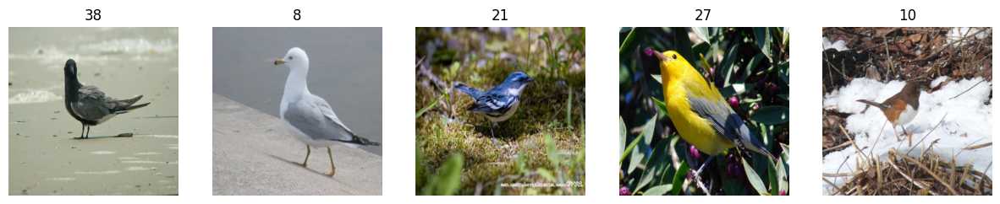

Epoch 4
Train Loss: 0.0004, Validation Loss: 0.2219, Validation Accuracy: 95.27%

Train Epoch 5 [0/885]	Loss: 0.041421
Train Epoch 5 [30/885]	Loss: 0.000336
Train Epoch 5 [60/885]	Loss: 0.000678
Train Epoch 5 [90/885]	Loss: 0.000871
Train Epoch 5 [120/885]	Loss: 0.001362
Train Epoch 5 [150/885]	Loss: 0.000583
Train Epoch 5 [180/885]	Loss: 0.000165
Train Epoch 5 [210/885]	Loss: 0.000161
Train Epoch 5 [240/885]	Loss: 0.008219
Train Epoch 5 [270/885]	Loss: 0.000237
Train Epoch 5 [300/885]	Loss: 0.000378
Train Epoch 5 [330/885]	Loss: 0.000272
Train Epoch 5 [360/885]	Loss: 0.000440
Train Epoch 5 [390/885]	Loss: 0.001235
Train Epoch 5 [420/885]	Loss: 0.000457
Train Epoch 5 [450/885]	Loss: 0.000382
Train Epoch 5 [480/885]	Loss: 0.000195
Train Epoch 5 [510/885]	Loss: 0.000217
Train Epoch 5 [540/885]	Loss: 0.000543
Train Epoch 5 [570/885]	Loss: 0.000062
Train Epoch 5 [600/885]	Loss: 0.000878
Train Epoch 5 [630/885]	Loss: 0.000046
Train Epoch 5 [660/885]	Loss: 0.000313
Train Epoch 5 [690/885]	Lo

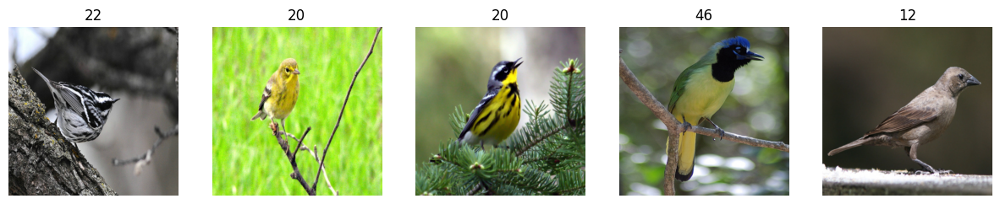

Epoch 5
Train Loss: 0.0002, Validation Loss: 0.2294, Validation Accuracy: 95.27%

Train Epoch 6 [0/885]	Loss: 0.001915
Train Epoch 6 [30/885]	Loss: 0.000596
Train Epoch 6 [60/885]	Loss: 0.000841
Train Epoch 6 [90/885]	Loss: 0.000138
Train Epoch 6 [120/885]	Loss: 0.001615
Train Epoch 6 [150/885]	Loss: 0.000242
Train Epoch 6 [180/885]	Loss: 0.000332
Train Epoch 6 [210/885]	Loss: 0.000971
Train Epoch 6 [240/885]	Loss: 0.000375
Train Epoch 6 [270/885]	Loss: 0.000461
Train Epoch 6 [300/885]	Loss: 0.000942
Train Epoch 6 [330/885]	Loss: 0.000108
Train Epoch 6 [360/885]	Loss: 0.001732
Train Epoch 6 [390/885]	Loss: 0.015399
Train Epoch 6 [420/885]	Loss: 0.000623
Train Epoch 6 [450/885]	Loss: 0.000261
Train Epoch 6 [480/885]	Loss: 0.000369
Train Epoch 6 [510/885]	Loss: 0.010004
Train Epoch 6 [540/885]	Loss: 0.005529
Train Epoch 6 [570/885]	Loss: 0.001431
Train Epoch 6 [600/885]	Loss: 0.000090
Train Epoch 6 [630/885]	Loss: 0.029021
Train Epoch 6 [660/885]	Loss: 0.002177
Train Epoch 6 [690/885]	Lo

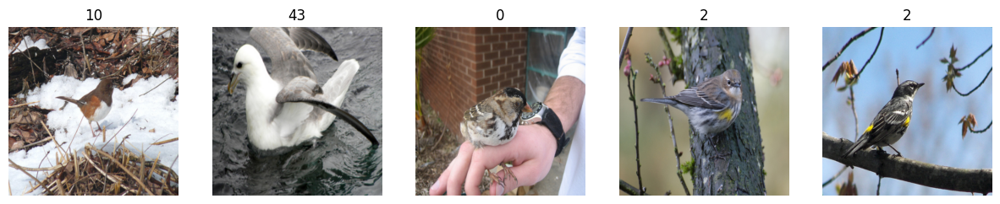

Epoch 6
Train Loss: 0.0000, Validation Loss: 0.2424, Validation Accuracy: 95.61%

Train Epoch 7 [0/885]	Loss: 0.000654
Train Epoch 7 [30/885]	Loss: 0.000095
Train Epoch 7 [60/885]	Loss: 0.027556
Train Epoch 7 [90/885]	Loss: 0.000625
Train Epoch 7 [120/885]	Loss: 0.000748
Train Epoch 7 [150/885]	Loss: 0.048899
Train Epoch 7 [180/885]	Loss: 0.004829
Train Epoch 7 [210/885]	Loss: 0.001521
Train Epoch 7 [240/885]	Loss: 0.005471
Train Epoch 7 [270/885]	Loss: 0.000240
Train Epoch 7 [300/885]	Loss: 0.000906
Train Epoch 7 [330/885]	Loss: 0.008089
Train Epoch 7 [360/885]	Loss: 0.000334
Train Epoch 7 [390/885]	Loss: 0.020829
Train Epoch 7 [420/885]	Loss: 0.000784
Train Epoch 7 [450/885]	Loss: 0.000528
Train Epoch 7 [480/885]	Loss: 0.074047
Train Epoch 7 [510/885]	Loss: 0.000225
Train Epoch 7 [540/885]	Loss: 0.000140
Train Epoch 7 [570/885]	Loss: 0.000120
Train Epoch 7 [600/885]	Loss: 0.000224
Train Epoch 7 [630/885]	Loss: 0.002877
Train Epoch 7 [660/885]	Loss: 0.000582
Train Epoch 7 [690/885]	Lo

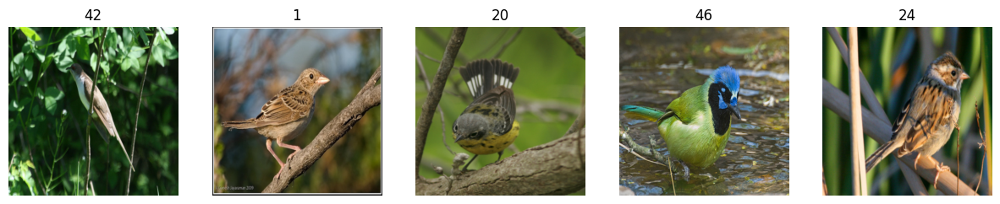

Epoch 7
Train Loss: 0.0000, Validation Loss: 0.1798, Validation Accuracy: 96.28%

Train Epoch 8 [0/885]	Loss: 0.000705
Train Epoch 8 [30/885]	Loss: 0.014261
Train Epoch 8 [60/885]	Loss: 0.000172
Train Epoch 8 [90/885]	Loss: 0.000024
Train Epoch 8 [120/885]	Loss: 0.000083
Train Epoch 8 [150/885]	Loss: 0.000886
Train Epoch 8 [180/885]	Loss: 0.001091
Train Epoch 8 [210/885]	Loss: 0.000145
Train Epoch 8 [240/885]	Loss: 0.000998
Train Epoch 8 [270/885]	Loss: 0.000098
Train Epoch 8 [300/885]	Loss: 0.000126
Train Epoch 8 [330/885]	Loss: 0.000118
Train Epoch 8 [360/885]	Loss: 0.000059
Train Epoch 8 [390/885]	Loss: 0.000148
Train Epoch 8 [420/885]	Loss: 0.000673
Train Epoch 8 [450/885]	Loss: 0.000028
Train Epoch 8 [480/885]	Loss: 0.000048
Train Epoch 8 [510/885]	Loss: 0.000553
Train Epoch 8 [540/885]	Loss: 0.000085
Train Epoch 8 [570/885]	Loss: 0.075853
Train Epoch 8 [600/885]	Loss: 0.000423
Train Epoch 8 [630/885]	Loss: 0.000103
Train Epoch 8 [660/885]	Loss: 0.160132
Train Epoch 8 [690/885]	Lo

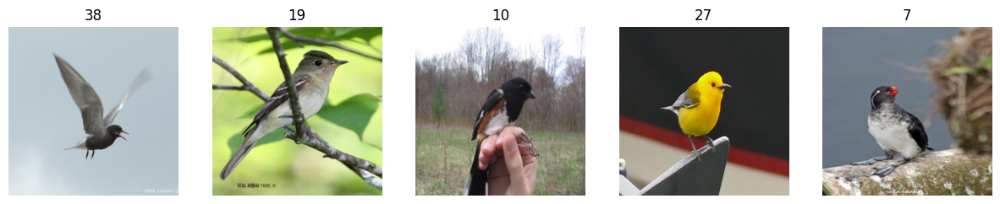

Epoch 8
Train Loss: 0.0001, Validation Loss: 0.1850, Validation Accuracy: 96.28%

Train Epoch 9 [0/885]	Loss: 0.003768
Train Epoch 9 [30/885]	Loss: 0.000301
Train Epoch 9 [60/885]	Loss: 0.003203
Train Epoch 9 [90/885]	Loss: 0.000287
Train Epoch 9 [120/885]	Loss: 0.000415
Train Epoch 9 [150/885]	Loss: 0.000626
Train Epoch 9 [180/885]	Loss: 0.002187
Train Epoch 9 [210/885]	Loss: 0.000467
Train Epoch 9 [240/885]	Loss: 0.000129
Train Epoch 9 [270/885]	Loss: 0.003672
Train Epoch 9 [300/885]	Loss: 0.002661
Train Epoch 9 [330/885]	Loss: 0.004913
Train Epoch 9 [360/885]	Loss: 0.000589
Train Epoch 9 [390/885]	Loss: 0.000472
Train Epoch 9 [420/885]	Loss: 0.002347
Train Epoch 9 [450/885]	Loss: 0.002818
Train Epoch 9 [480/885]	Loss: 0.000531
Train Epoch 9 [510/885]	Loss: 0.001047
Train Epoch 9 [540/885]	Loss: 0.000425
Train Epoch 9 [570/885]	Loss: 0.000081
Train Epoch 9 [600/885]	Loss: 0.000267
Train Epoch 9 [630/885]	Loss: 0.000038
Train Epoch 9 [660/885]	Loss: 0.001893
Train Epoch 9 [690/885]	Lo

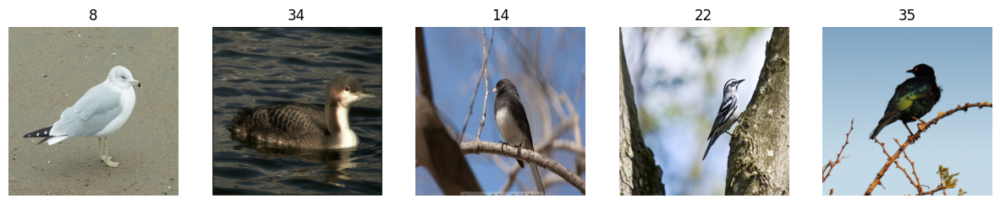

Epoch 9
Train Loss: 0.0005, Validation Loss: 0.2358, Validation Accuracy: 93.92%

[FINAL with Augmentation] Test Loss: 0.3463, Accuracy: 93.9597%
Best Accuracy: 96.28%
Elapsed Time: 3h, 21m, 32s
time: 3h, 201m, 32s


In [10]:
### Main ###
start = time.time()
best = 0

### wandb ###
wandb.watch(model, log="all")

for epoch in range(EPOCH):
    # With Augmentation
    train_loss = train(model, train_loader, optimizer, epoch)
    val_loss, val_accuracy = evaluate(model, val_loader)

    # Save best model
    if val_accuracy > best:
        best = val_accuracy
        torch.save(model.state_dict(), "./best_model.pth")

    # augmentation 적용한 이미지 보기
    dataiter = iter(train_loader)
    images, labels = dataiter.__next__()
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))
    for i in range(5):
      image = images[i].numpy().transpose((1, 2, 0))
      image = np.clip(image, 0, 1)
      axes[i].imshow(image)
      axes[i].set_title(labels[i].item())
      axes[i].axis('off')
    plt.show()

    # Logging for model without augmentation
    wandb.log({
        'train_loss_with_aug': train_loss.item(),
        'val_loss_with_aug': val_loss,
        'val_accuracy_with_aug': val_accuracy,
    })

    print(f'Epoch {epoch}')
    print(f"Train Loss: {train_loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_accuracy:.2f}%")
    print("")

# Test results
test_loss, test_accuracy = evaluate(model, test_loader)

wandb.log({'test_accuracy_with_aug': test_accuracy})

print(f'[FINAL with Augmentation] Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}%')

end = time.time()
elasped_time = end - start
print(f"Best Accuracy: {best:.2f}%")
print(f"Elapsed Time: {int(elasped_time/3600)}h, {int((elasped_time%3600)/60)}m, {int(elasped_time%60)}s")
print(f"time: {int (elasped_time/3600)}h, {int(elasped_time/60)}m, {int(elasped_time%60)}s")

In [11]:
torch.save(model.state_dict(), "./model_state_dict.pt")

In [12]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 23.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38244 sha256=feea558ac3b7507004977c91a386cf4aa3ae94126aa66df08fc04d9dfeedeaf6
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


Test Loss: 0.3463, Accuracy: 93.9597%


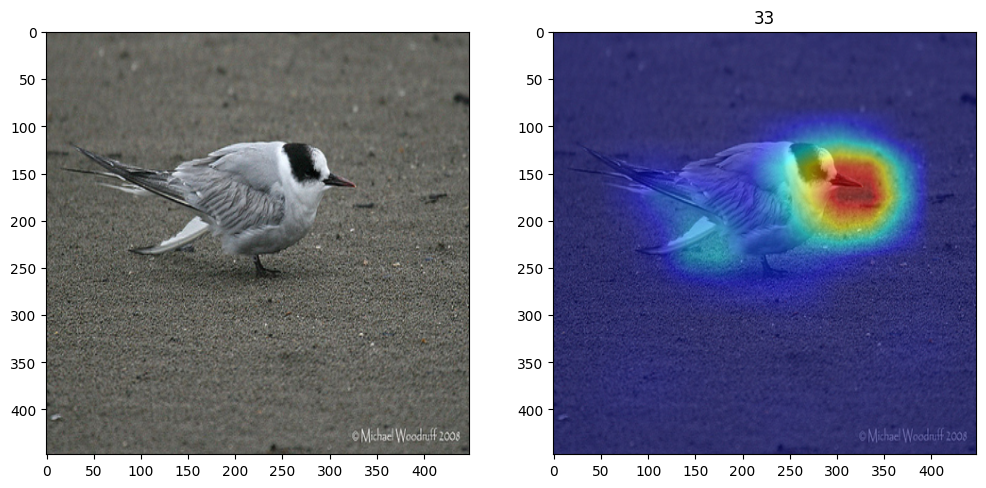

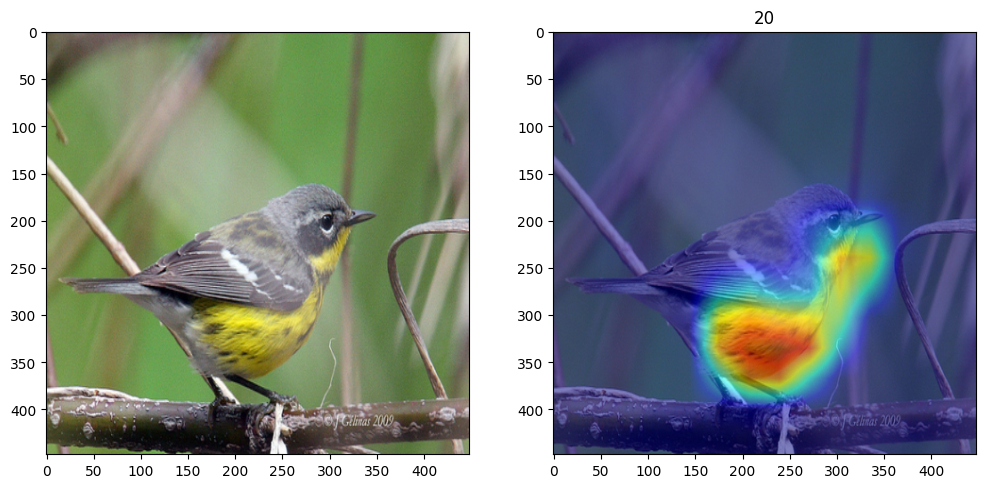

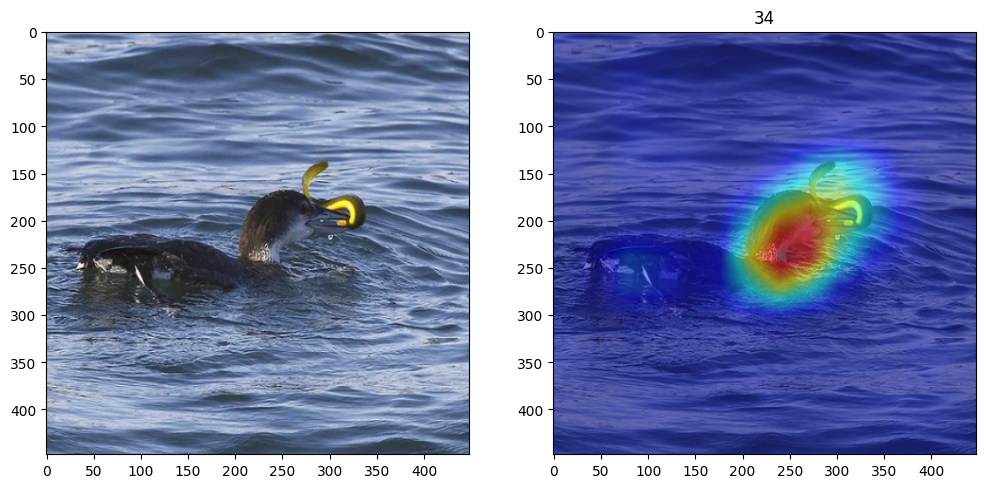

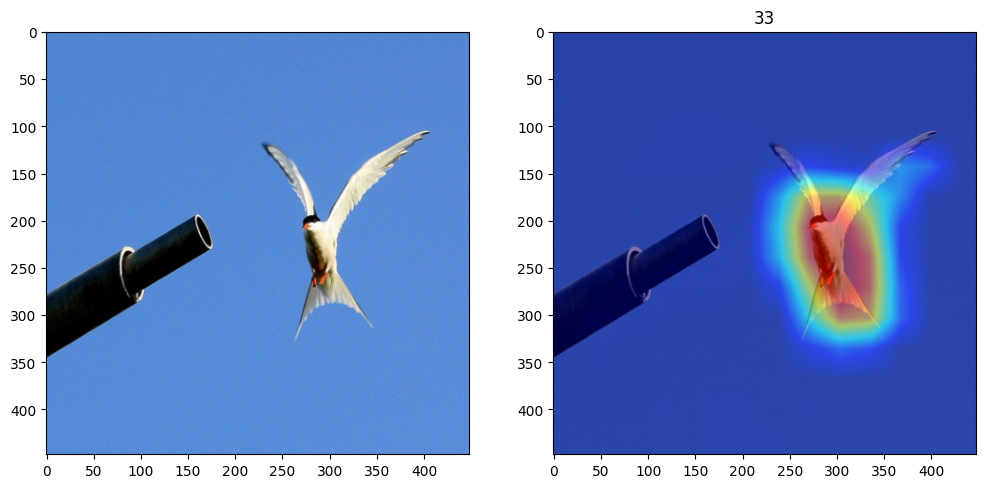

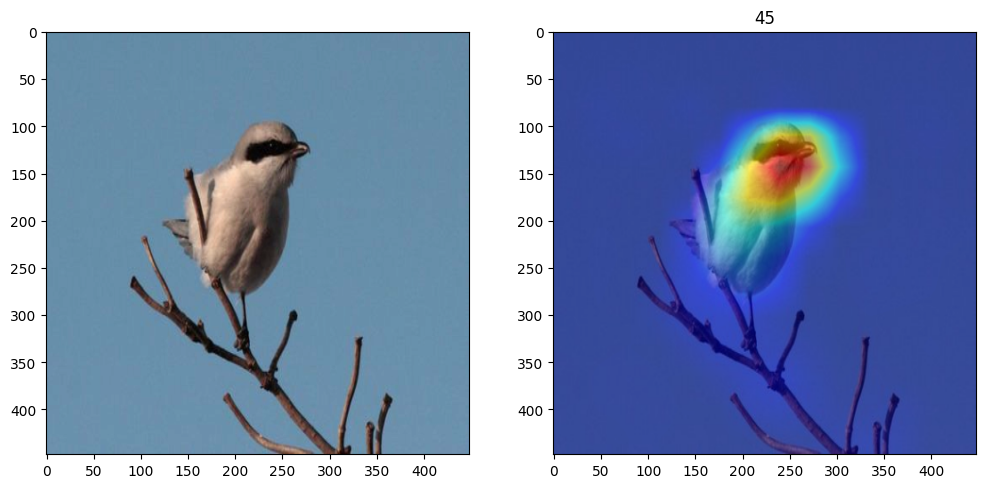

...

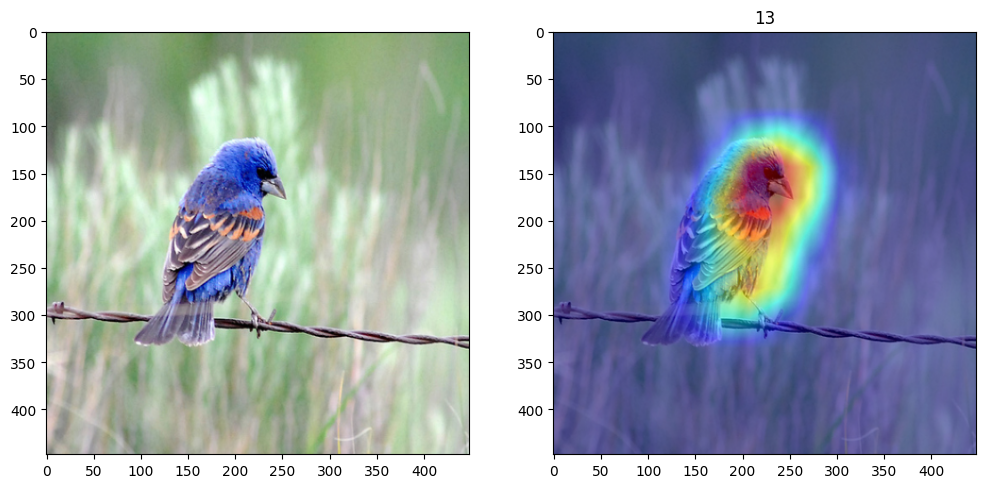

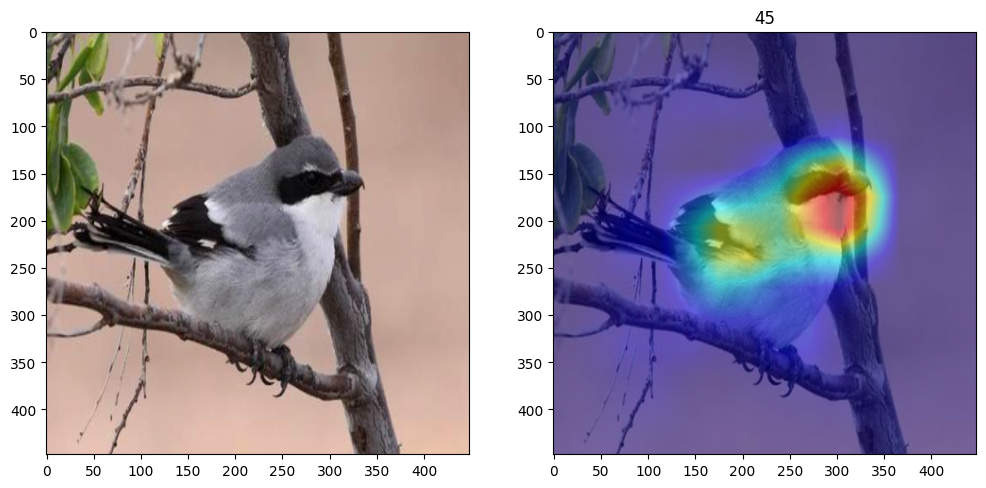

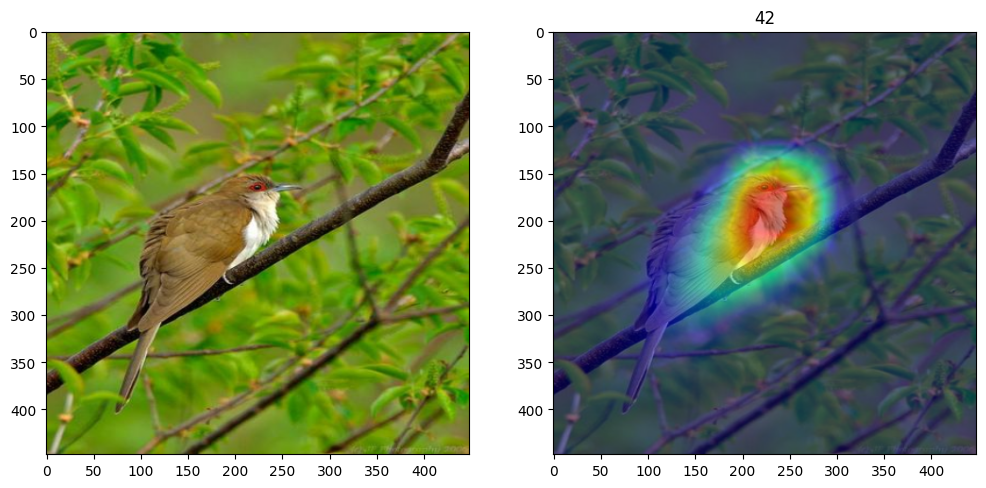

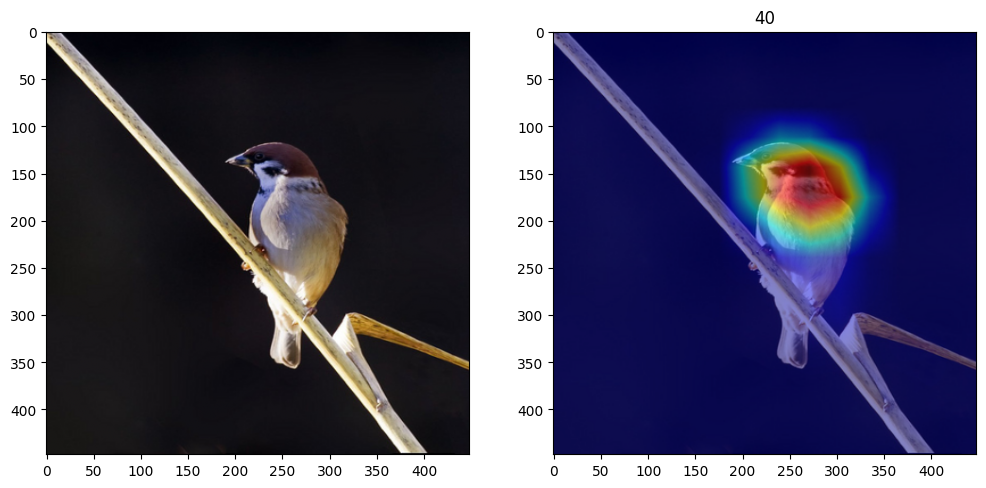

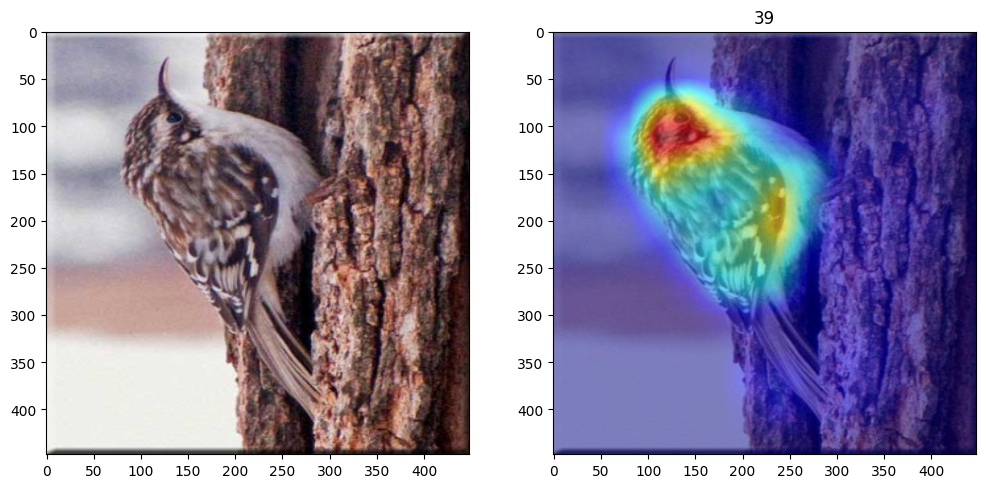

In [13]:
import copy
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
from torchvision.models import resnet18
import numpy as np
from PIL import Image
import torch
import torch.nn as nn
import torchvision
import torchvision.transforms as T
from matplotlib import pyplot as plt
"""
model = model_
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, 50)
model = model.to(DEVICE)
optimizer = optim.SGD(model.parameters(), lr=lr)

model.load_state_dict(torch.load("model_state_dict.pt"))
model.eval()
"""

test_loss, test_accuracy = evaluate(model, test_loader)


print(f'Test Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}%')


def gradCAM_func(num):
  image_tensor, label = combined_train_set[num]
  transform = T.ToPILImage()
  rgb_img = transform(image_tensor)
  target_layers = [model.layer4[-1]]
  # Max min normalization
  rgb_img = (rgb_img - np.min(rgb_img)) / (np.max(rgb_img) - np.min(rgb_img))
  # Create an input tensor image for your model
  input_tensor = torchvision.transforms.functional.to_tensor(rgb_img).unsqueeze(0).float()
  # Note: input_tensor can be a batch tensor with several images!

  # Construct the CAM object once, and then re-use it on many images:
  cam = GradCAM(model=model, target_layers=target_layers, use_cuda=True)

  grayscale_cam = cam(input_tensor=input_tensor)

  # In this example grayscale_cam has only one image in the batch:
  grayscale_cam = grayscale_cam[0, :]
  visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
  Image.fromarray(visualization, 'RGB')
  fig, ax = plt.subplots(1, 2, figsize=(12, 6))

  # Display the image using imshow
  ax[0].imshow(rgb_img)
  ax[1].imshow(visualization)

  # Show the plot
  plt.title(label)
  plt.show()

  # Image.fromarray(visualization, 'RGB')

# 괄호 안에 아무 수나 넣고 테스트하면 됩니다.
for i in range(200):
  if i % 10 == 0:
    gradCAM_func(i)